In [3]:
import scanpy as sc
import pandas as pd 
import numpy as np
from scipy.sparse import csr_matrix
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook as tqdm
import warnings
import itertools as it
import pickle as pkl
from copy import copy

In [4]:
# might need this, the most recent version of jupterlab I installed installed the most recent version of jedi which has been having problems with autocomplete
# see thread here: https://github.com/ipython/ipython/issues/10493
%config Completer.use_jedi = False
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80)

## Reading in Data

In [5]:
exps = dict()
for exp in range(5):
    exps[exp] = dict()

In [10]:
prefix = '/data/xyzeq/xyzeq/individual.raw.and.proc.h5ads/'

In [11]:
exps[0]['path'] = prefix + '20190831/20180831_L10C.h5ad' # shallow
exps[1]['path'] = prefix + '20190920/20190920_L20C1.h5ad' # deep
exps[2]['path'] = prefix + '20190920/20190920_L20T.h5ad' # deep
exps[3]['path'] = prefix + '20190831/20180831_L30C.h5ad' # shallow
exps[4]['path'] = prefix + '20190831/20180831_L30C8.h5ad' # shallow

In [12]:
for exp in exps:
    exps[exp]['adata'] = sc.read_h5ad(exps[exp]['path'])

In [13]:
for exp in exps:
    exps[exp]['label'] = exps[exp]['path'].split('/')[-1]

## Filtering for Cells, Labeling Human and Mouse Cells

In [14]:
human_genes = [i for i in exps[0]['adata'].var_names if i.startswith('hg19_')]
mouse_genes = [i for i in exps[0]['adata'].var_names if i.startswith('mm10_')]

Extract out separate adatas for each genome, and extract out UMIs as "n_counts" in obs (per cell) and in the vars (per gene).

In [15]:
def my_plot(ax, vals, tupe=None, thresh=None, max_y=None):
    ax.hist(vals,bins=np.logspace(np.log10(0.1),np.log10(50000), 500),color='gray') # logspace bins looks great!
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.set_title(tupe)
    ax.grid(which='both', alpha=0.5)
    if thresh != None:
        ax.vlines(thresh,0,max_y)
    return

After running this multiple times I've determined these threshold values based on gating the distributions, though they could definitely be adjusted. To actually plot out the distributions, uncomment the code in the second cell.

In [16]:
filtering_vals = [[120, 70, 50, 30], 
                  [5000, 2000, 60, 30], 
                  [1200, 600, 500, 20], 
                  [500, 200, 30, 20], 
                  [300, 200, 30, 20]]

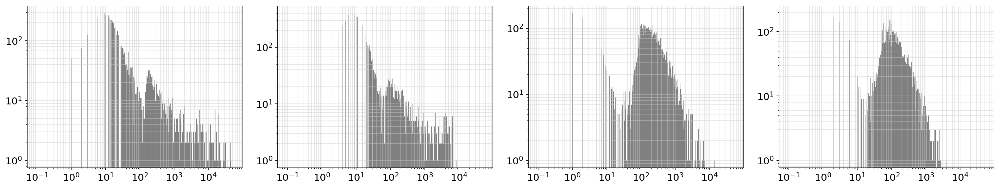

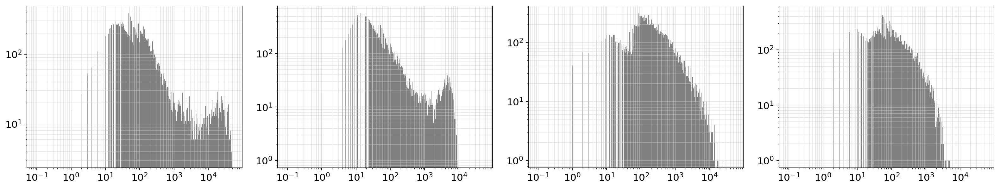

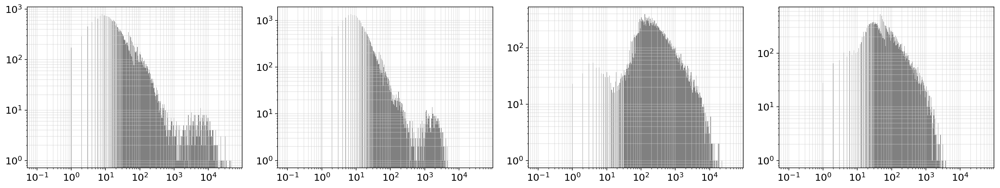

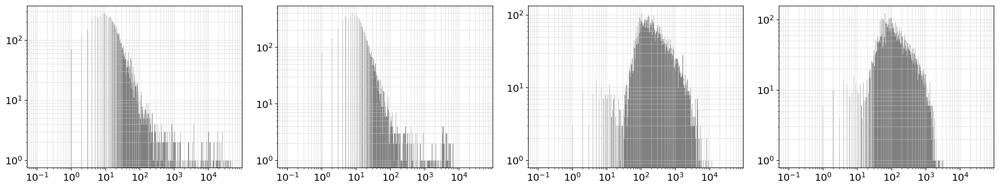

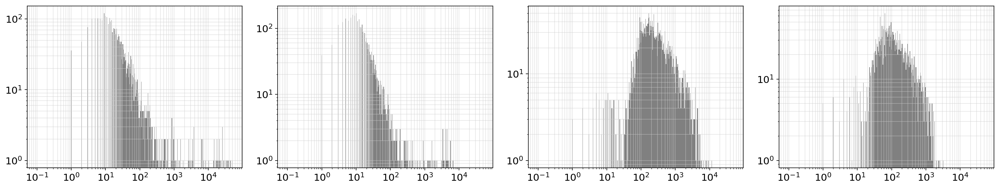

In [17]:
for exp, filtervals in zip(exps, filtering_vals):
    exps[exp]['adata_human'] = exps[exp]['adata'][:,human_genes].copy()
    exps[exp]['adata_human'].var_names = [i[5:] for i in exps[exp]['adata_human'].var_names] # no need for the genome tag at the beginning anymore
    exps[exp]['adata_mouse'] = exps[exp]['adata'][:,mouse_genes].copy()
    exps[exp]['adata_mouse'].var_names = [i[5:] for i in exps[exp]['adata_mouse'].var_names]
    
#     del exps[exp]['adata']
    
    fig, axes = plt.subplots(1,4,figsize=(20,4))
    for tupe, ax in zip(it.product([exps[exp]['adata_human'], exps[exp]['adata_mouse']],['counts','genes']), axes):
        if tupe[1] == 'counts': # get counts
            vals = sc.pp.filter_cells(tupe[0], min_counts=0,inplace=False)[1] # total number of UMIs observed
        else:
            vals = sc.pp.filter_cells(tupe[0], min_genes=0,inplace=False)[1] # total number of UMIs observed
        my_plot(ax, vals)
    plt.tight_layout()
    plt.show()

#     exps[exp]['human_min_counts'] = filtervals[0] #int(input())
#     exps[exp]['human_min_genes'] = filtervals[1] #int(input())

#     exps[exp]['mouse_min_counts'] = filtervals[2] #int(input())
#     exps[exp]['mouse_min_genes'] = filtervals[3] #int(input())
    
#     exps[exp]['human_min_counts'] = int(input())
#     exps[exp]['human_min_genes'] = int(input())

#     exps[exp]['mouse_min_counts'] = int(input())
#     exps[exp]['mouse_min_genes'] = int(input())

In [14]:
for exp in exps:
    exps[exp]['adata_human'].obs['human_cells_counts_bool'] = sc.pp.filter_cells(exps[exp]['adata_human'],min_counts=exps[exp]['human_min_counts'],inplace=False)[0]
    exps[exp]['adata_human'].obs['human_cells_counts_vals'] = sc.pp.filter_cells(exps[exp]['adata_human'],min_counts=exps[exp]['human_min_counts'],inplace=False)[1]

    exps[exp]['adata_human'].obs['human_cells_genes_bool'] = sc.pp.filter_cells(exps[exp]['adata_human'],min_counts=exps[exp]['human_min_genes'],inplace=False)[0]
    exps[exp]['adata_human'].obs['human_cells_genes_vals'] = sc.pp.filter_cells(exps[exp]['adata_human'],min_counts=exps[exp]['human_min_genes'],inplace=False)[1]

    exps[exp]['adata_mouse'].obs['mouse_cells_counts_bool'] = sc.pp.filter_cells(exps[exp]['adata_mouse'],min_counts=exps[exp]['mouse_min_counts'],inplace=False)[0]
    exps[exp]['adata_mouse'].obs['mouse_cells_counts_vals'] = sc.pp.filter_cells(exps[exp]['adata_mouse'],min_counts=exps[exp]['mouse_min_counts'],inplace=False)[1]

    exps[exp]['adata_mouse'].obs['mouse_cells_genes_bool'] = sc.pp.filter_cells(exps[exp]['adata_mouse'],min_counts=exps[exp]['mouse_min_genes'],inplace=False)[0]
    exps[exp]['adata_mouse'].obs['mouse_cells_genes_vals'] = sc.pp.filter_cells(exps[exp]['adata_mouse'],min_counts=exps[exp]['mouse_min_genes'],inplace=False)[1]

filtered out 6595 cells that haveless than 120 counts
filtered out 6595 cells that haveless than 120 counts
filtered out 6385 cells that haveless than 70 counts
filtered out 6385 cells that haveless than 70 counts
filtered out 1176 cells that haveless than 50 counts
filtered out 1176 cells that haveless than 50 counts
filtered out 1056 cells that haveless than 30 counts
filtered out 1056 cells that haveless than 30 counts
filtered out 25230 cells that haveless than 5000 counts
filtered out 25230 cells that haveless than 5000 counts
filtered out 24805 cells that haveless than 2000 counts
filtered out 24805 cells that haveless than 2000 counts
filtered out 5436 cells that haveless than 60 counts
filtered out 5436 cells that haveless than 60 counts
filtered out 3065 cells that haveless than 30 counts
filtered out 3065 cells that haveless than 30 counts
filtered out 27486 cells that haveless than 1200 counts
filtered out 27486 cells that haveless than 1200 counts
filtered out 27371 cells t

In [15]:
for exp in exps:
    human = (exps[exp]['adata_human'].obs['human_cells_counts_bool'] == True) & (exps[exp]['adata_human'].obs['human_cells_genes_bool'] == True) & \
    (exps[exp]['adata_mouse'].obs['mouse_cells_counts_bool'] == False) & (exps[exp]['adata_mouse'].obs['mouse_cells_genes_bool'] == False)

    mouse = (exps[exp]['adata_mouse'].obs['mouse_cells_counts_bool'] == True) & (exps[exp]['adata_mouse'].obs['mouse_cells_genes_bool'] == True) & \
    (exps[exp]['adata_human'].obs['human_cells_counts_bool'] == False) & (exps[exp]['adata_human'].obs['human_cells_genes_bool'] == False)
    
    exps[exp]['adata_human'] = exps[exp]['adata_human'][human].copy()
    exps[exp]['adata_mouse'] = exps[exp]['adata_mouse'][mouse].copy()

In [16]:
exps[1]

{'path': '/myvol/data2/20190920/20190920_L20C1.h5ad',
 'adata': AnnData object with n_obs × n_vars = 26436 × 121472 ,
 'label': '20190920_L20C1.h5ad',
 'adata_human': AnnData object with n_obs × n_vars = 3 × 65476 
     obs: 'human_cells_counts_bool', 'human_cells_counts_vals', 'human_cells_genes_bool', 'human_cells_genes_vals',
 'adata_mouse': AnnData object with n_obs × n_vars = 19492 × 55996 
     obs: 'mouse_cells_counts_bool', 'mouse_cells_counts_vals', 'mouse_cells_genes_bool', 'mouse_cells_genes_vals',
 'human_min_counts': 5000,
 'human_min_genes': 2000,
 'mouse_min_counts': 60,
 'mouse_min_genes': 30}

## Combining Mouse and Human Cells, Filtering for Genes

In [17]:
for exp in exps:
    exps[exp]['adata'] = exps[exp]['adata'][np.unique(np.concatenate([exps[exp]['adata_human'].obs_names.values, exps[exp]['adata_mouse'].obs_names.values],axis=0))].copy()

In [18]:
adata = exps[0]['adata'].concatenate(exps[1]['adata'],exps[2]['adata'],exps[3]['adata'],exps[4]['adata'], join='inner').copy()

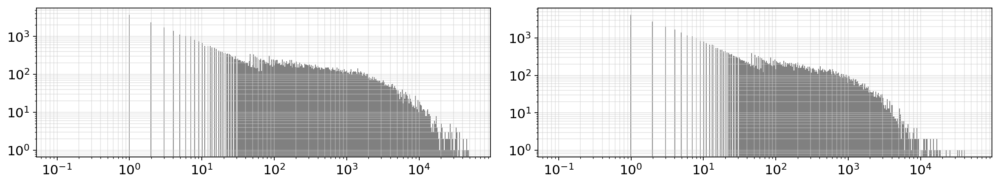

In [19]:
# for exp in exps:
fig, axes = plt.subplots(1,2,figsize=(15,3))
vals = sc.pp.filter_genes(adata, min_counts=0,inplace=False)[1] # total number of UMIs observed
my_plot(axes[0], vals)

vals = sc.pp.filter_genes(adata, min_cells=0,inplace=False)[1] # total number of UMIs observed
my_plot(axes[1], vals)

plt.tight_layout()
plt.show()

In [20]:
# for exp in exps:
sc.pp.filter_genes(adata,min_counts=60)
sc.pp.filter_genes(adata,min_cells=60)

filtered out 96904 genes that are detectedin less than 60 counts
filtered out 4170 genes that are detectedin less than 60 cells


## Mitochondrial Visualization
I plot for visualization but I do not remove these cells. I will remove them when they cluster out separately from the other cells in UMAP/Leiden space.

In [21]:
genelist = adata.var_names.tolist()
mito_genes_names_mouse = [gn for gn in genelist if gn.startswith('mm10_mt-')]
mito_genes_names_human = [gn for gn in genelist if gn.startswith('hg19_MT-')]
mito_genes_mouse = [genelist.index(gn) for gn in mito_genes_names_mouse]
mito_genes_human = [genelist.index(gn) for gn in mito_genes_names_human]

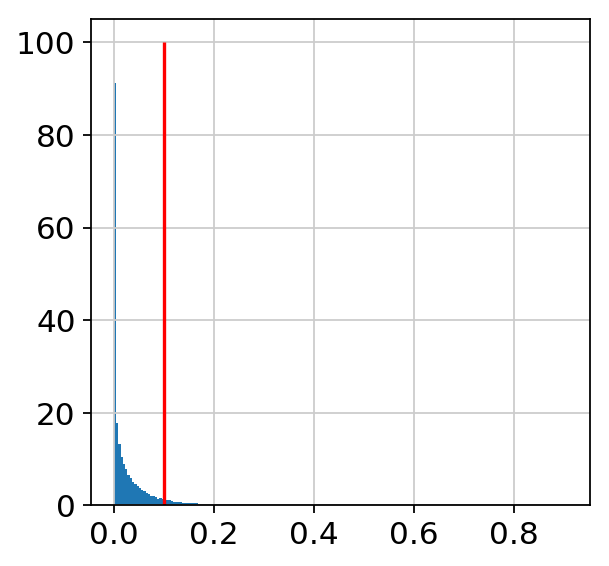

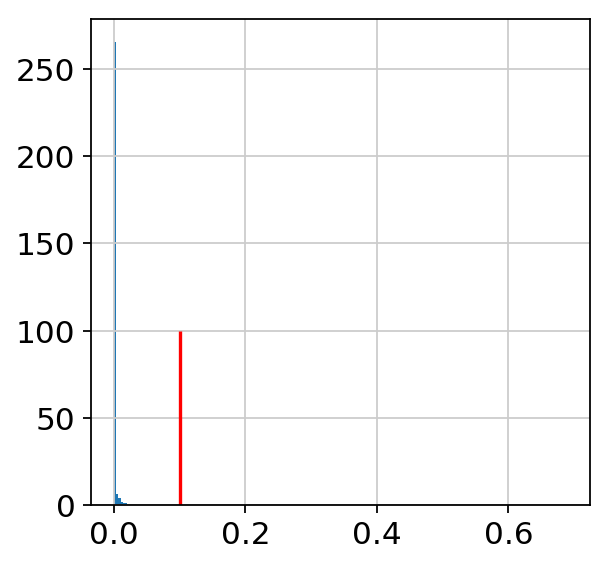

In [22]:
adata.obs['percent_mito_mouse'] = np.ravel(np.sum(adata[:, mito_genes_mouse].X, axis=1)) / np.ravel(np.sum(adata.X, axis=1))
adata.obs['percent_mito_human'] = np.ravel(np.sum(adata[:, mito_genes_human].X, axis=1)) / np.ravel(np.sum(adata.X, axis=1))

plt.hist(adata.obs['percent_mito_mouse'].values,bins=200,density=True)
plt.vlines(0.1,0,100,color='r');
plt.show()
plt.hist(adata.obs['percent_mito_human'].values,bins=200,density=True)
plt.vlines(0.1,0,100,color='r');

## Preprocessing
After running multiple iterations, it seems like keeping _all_ genes in the matrix is important for retaining a lot of the heterogeneity, so I don't filter for highly-variable genes here.

In [23]:
adata_ori = adata.copy()

In [24]:
def process1(adata):
    sc.pp.log1p(adata)
    sc.pp.normalize_per_cell(adata)
    return adata

In [25]:
adata = process1(adata)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


Combat was run on a separate machine with more memory and then transfered back to this machine. You can load in the combatted version below. 

In [26]:
# adata.write_h5ad('/myvol/data2/deep/concat.deep.adata.m.and.h.h5ad')

In [ ]:
# I ran this on a separate machine with more memory, requires more because there are so many genes. 
# warnings.filterwarnings('ignore')
# sc.pp.combat(adata)
# warnings.filterwarnings('default')

In [3]:
adata = sc.read_h5ad('/myvol/data2/deep/concat.deep.adata.m.and.h.combatted.h5ad')

## Dimensionality Reduction and Visualization

In [4]:
sc.pp.scale(adata, max_value=10)

In [5]:
sc.pp.pca(adata, n_comps=100)

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 100
    finished (0:00:32)


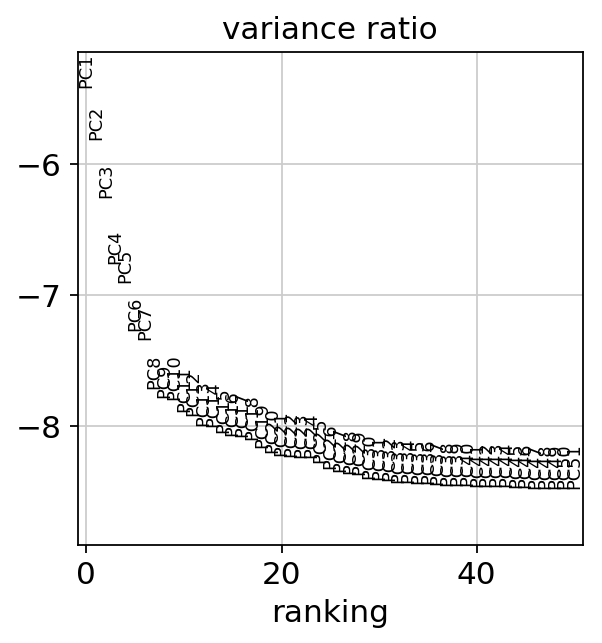

In [6]:
sc.pl.pca_variance_ratio(adata,log=True, n_pcs=50)

In [7]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(adata,n_neighbors=15,n_pcs=40) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:19)


In [8]:
sc.tl.umap(adata, spread=5, alpha=2)

computing UMAP


/usr/local/lib/python3.6/dist-packages/umap/umap_.py:1052: RuntimeWarning: divide by zero encountered in power
  return 1.0 / (1.0 + a * x ** (2 * b))


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:56)


In [9]:
sc.tl.leiden(adata,resolution=2.5)

running Leiden clustering
    finished: found 38 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:45)


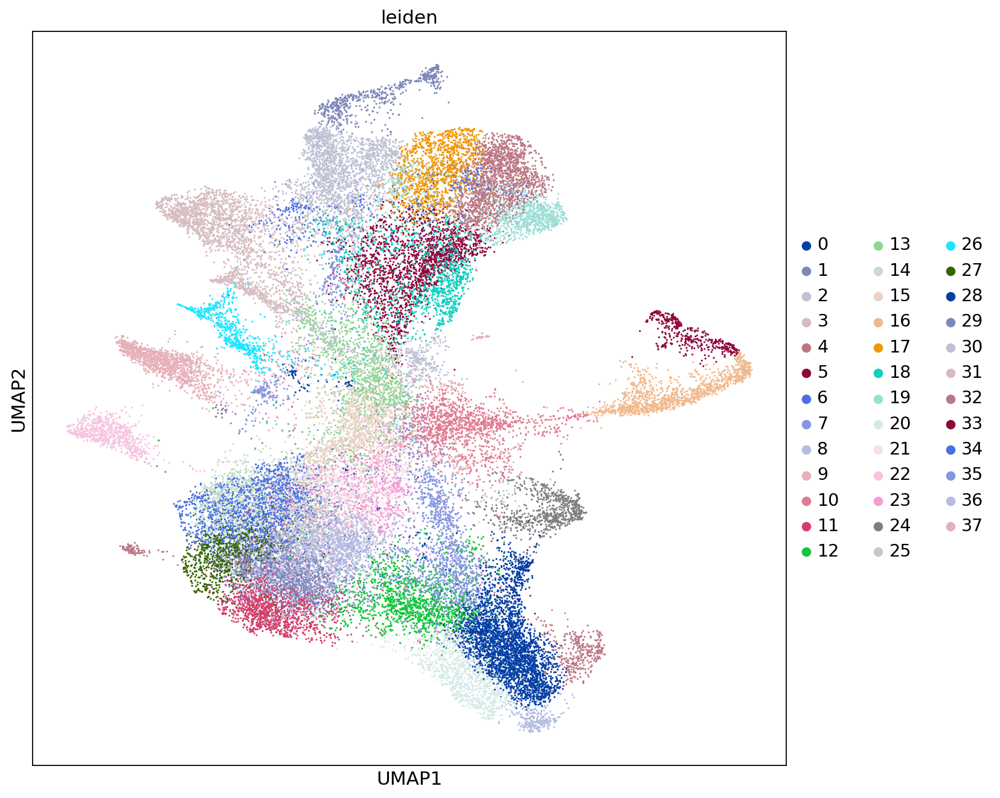

In [10]:
fig, ax = plt.subplots(1,1,figsize=(10,10))
sc.pl.umap(adata,color=['leiden'], ax=ax, size=8, palette=sc.pl.palettes.default_26)

Examine the batch effect, if any.

In [ ]:
# scanpy's stupid sort order doesn't work with categorical variables, need to make a separate covariate with a "continuous" scale, but I will only make it have two values (0 and 1)
batches = adata.obs['batch'].unique() # get a list of the batches

# make a new column in the `.obs` for each batch that is of dtype `int` so that it gets plotted as a continuous variable instead of a categorical one
for batch in batches:
    adata.obs['batch_%s' % batch] = (adata.obs['batch'] == batch).astype(int)
sc.pl.umap(adata, color=['batch_%s' % i for i in batches],sort_order=True, ncols=5)

plt.tight_layout()

After running multiple times, I suggest we use 'hg19_RP11-323I15.5', in combination with other factors, as the justification for removal of low-quality clusters:

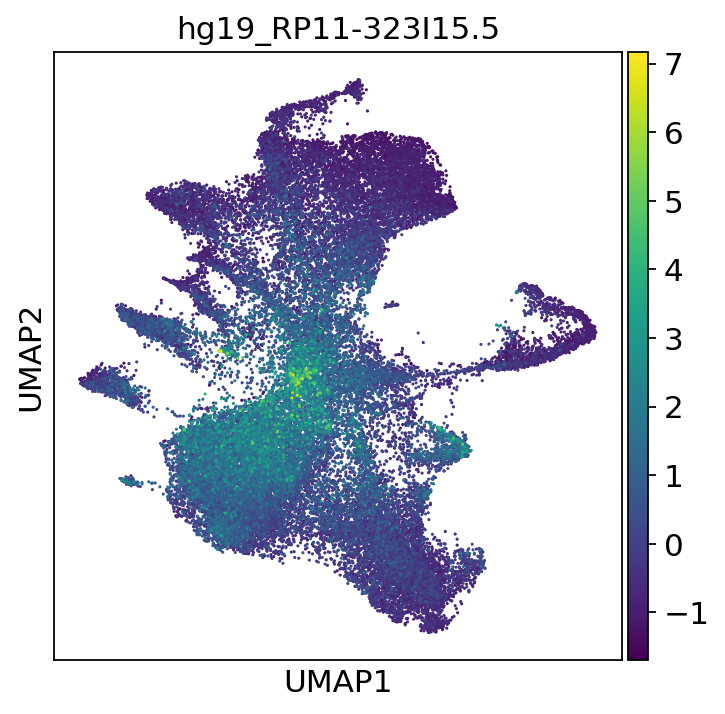

In [12]:
fig, ax = plt.subplots(1,1,figsize=(5,5))
sc.pl.umap(adata,color=['hg19_RP11-323I15.5'], ax=ax, size=8, palette=sc.pl.palettes.default_26)

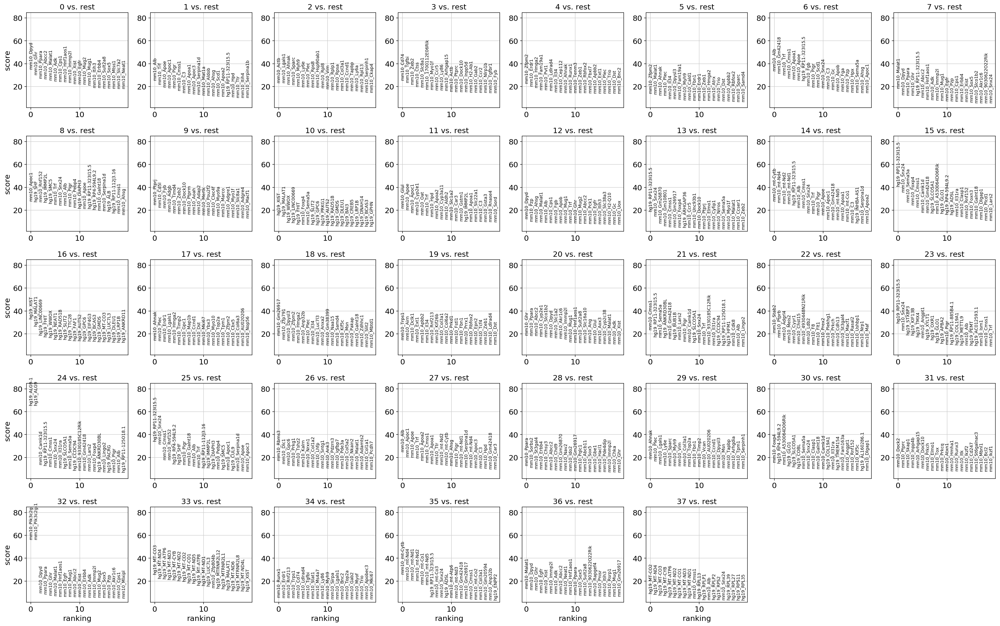

In [13]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata,groupby='leiden')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata, ncols=8)
sc.settings.verbosity = 3

## Extra Code

The rest of this code was used at one point but I decided to do further processing of the data in a separate notebook.

#### Filtering for Low-quality Cells

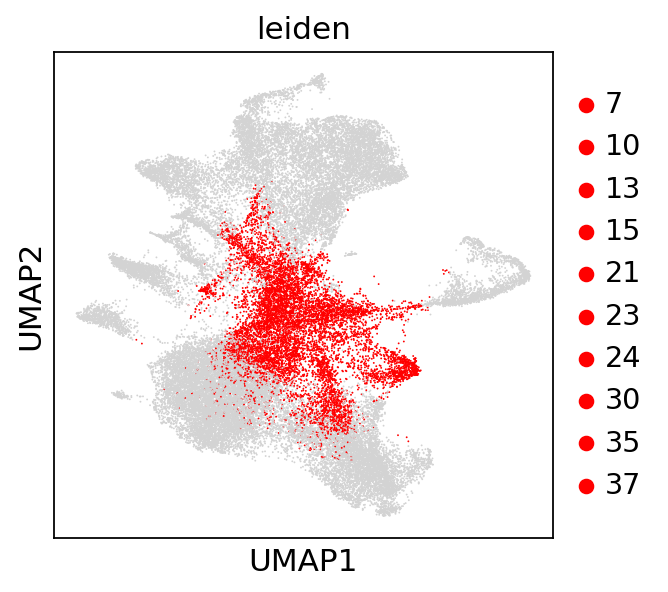

In [13]:
sc.pl.umap(adata,color=['leiden'],groups=['7', '10','13','15', '21', '23', '24', '30', '35', '37'],palette=['red'])

In [14]:
ctdict = dict()
ctdict['LowQ'] = [7, 10, 13, 15,21, 23, 24, 30, 35, 37]
ctdict['Other'] = [i for i in range(38) if i not in ctdict['LowQ']]
adata.obs['celltype'] = adata.obs['leiden']
for ct in ctdict:
    for clust in ctdict[ct]:
        adata.obs['celltype'].replace(r'^%s$' % str(clust),ct,regex=True, inplace=True)
adata.obs['celltype'] = adata.obs['celltype'].astype('category')

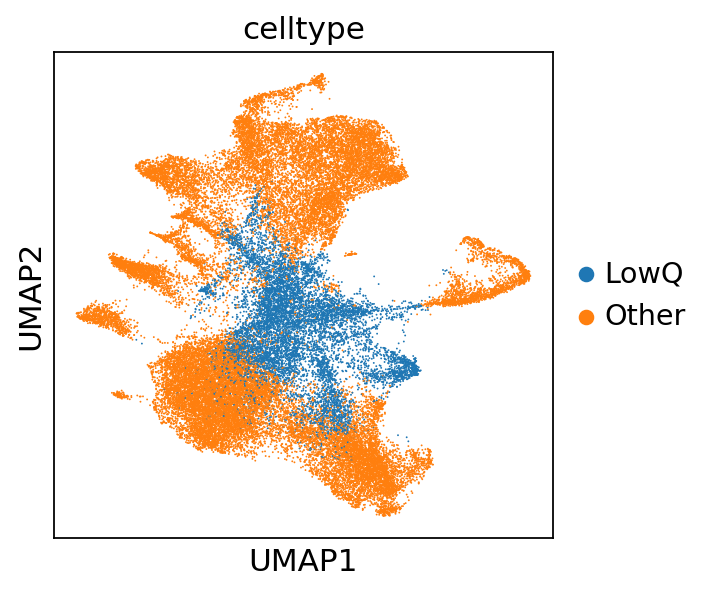

In [15]:
sc.pl.umap(adata,color=['celltype'])

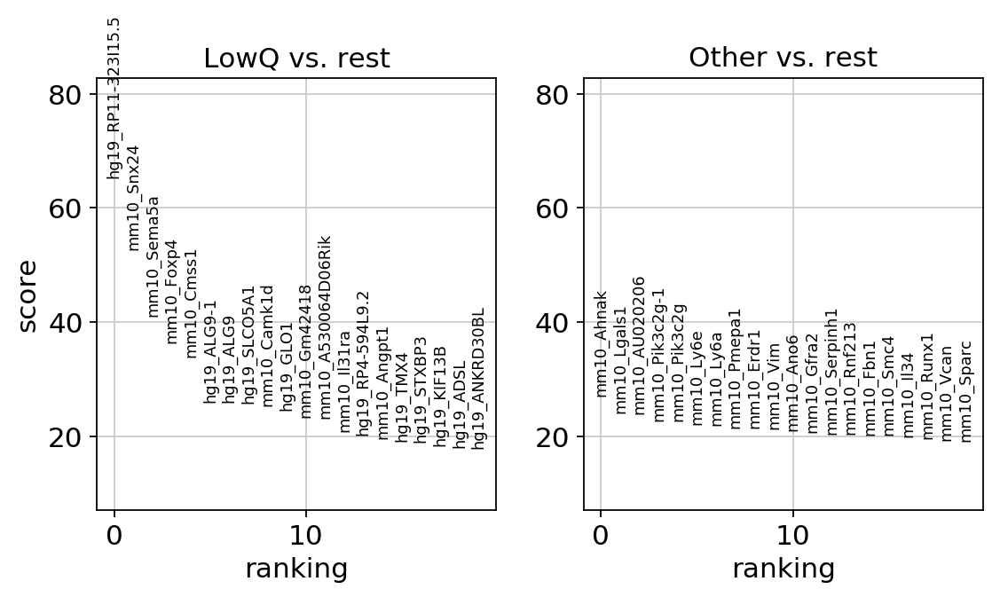

In [16]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata,groupby='celltype')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata)
sc.settings.verbosity = 3

In [17]:
adata.uns['rank_genes_groups']['names']['LowQ'][:50]

array(['hg19_RP11-323I15.5', 'mm10_Snx24', 'mm10_Sema5a', 'mm10_Foxp4',
       'mm10_Cmss1', 'hg19_ALG9-1', 'hg19_ALG9', 'hg19_SLCO5A1',
       'mm10_Camk1d', 'hg19_GLO1', 'mm10_Gm42418', 'mm10_A530064D06Rik',
       'mm10_Il31ra', 'hg19_RP4-594L9.2', 'mm10_Angpt1', 'hg19_TMX4',
       'hg19_STXBP3', 'hg19_KIF13B', 'hg19_ADSL', 'hg19_ANKRD30BL',
       'hg19_COL19A1', 'mm10_Lars2', 'hg19_CCDC94', 'hg19_XYLT1',
       'mm10_9330185C12Rik', 'mm10_Dlgap1', 'mm10_Foxn3', 'hg19_OXR1',
       'mm10_Clasp1', 'mm10_Rnf152', 'hg19_COBL', 'mm10_Plcd1',
       'mm10_Skint6', 'mm10_Lingo2', 'hg19_PACRG', 'mm10_AA474408',
       'mm10_Itpr2', 'mm10_Pigr', 'mm10_Spata5', 'hg19_RP11-125O18.1',
       'mm10_Ccser1', 'hg19_AAMDC', 'hg19_BUB1B', 'mm10_Gm26561',
       'hg19_RYR2', 'hg19_XIST', 'mm10_Galnt18', 'hg19_NELL2',
       'hg19_LA16c-444G7.1', 'mm10_Cdk8'], dtype='<U50')

#### Regressing for LowQ
This was the way I thought was proper to remove PCs from the analysis, but I think the more straightforward way is to do as outlined here:

https://stats.stackexchange.com/questions/115032/how-to-find-which-variables-are-most-correlated-with-the-first-principal-compone

However, keeping this code just in case I need it for anythign in the future.

In [18]:
contam_genes = adata.uns['rank_genes_groups']['names']['LowQ']

In [19]:
other_genes = [i for i in adata.var_names if i not in contam_genes]

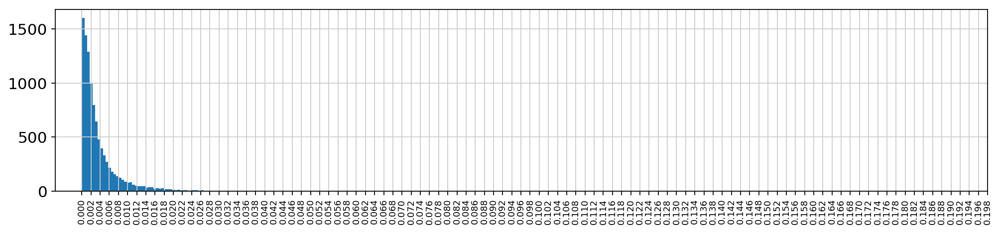

In [20]:
to_plot = list()
rand_pcs = list()
for i in np.random.choice(other_genes,size=100):
    vals = adata.varm['PCs'][adata.var_names.tolist().index(i),:]
    to_plot.append(np.absolute(vals))
    rand_pcs.append(np.argwhere(vals > 0.008))
plt.figure(figsize=(15,3)) 
plt.hist(np.ravel(to_plot),bins=200);
plt.xticks(np.arange(0,0.2,0.002), rotation=90, size=8);

[(0, 16), (5, 15), (1, 13), (32, 11), (40, 11), (79, 11), (43, 10), (62, 10), (66, 10), (96, 10)]


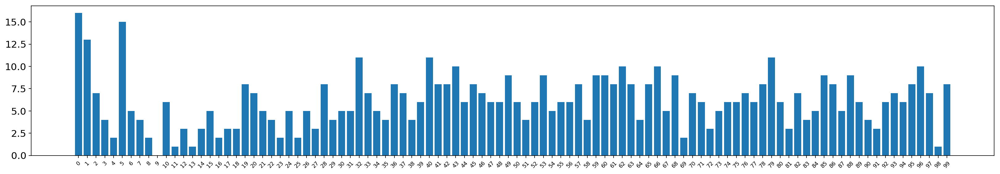

In [21]:
vals, counts = np.unique(np.concatenate(rand_pcs).flatten(),return_counts=True)

plt.figure(figsize=(25,4))
plt.bar(vals, counts);
plt.xticks(ticks=range(100),labels=range(100),rotation=45, size=8)
plt.grid()

print(sorted(list(zip(vals,counts)),key= lambda x: x[1], reverse=True)[:10])

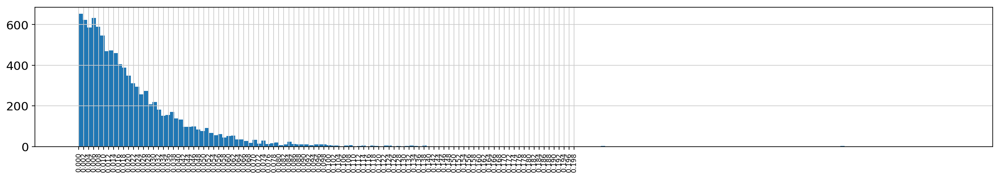

In [22]:
to_plot = list()
contam_pcs = list()
for i in contam_genes:
    vals = adata.varm['PCs'][adata.var_names.tolist().index(i),:]
    to_plot.append(np.absolute(vals))
    contam_pcs.append(np.argwhere(vals > 0.040))
plt.figure(figsize=(20,3)) 
plt.hist(np.ravel(to_plot),bins=200);
plt.xticks(np.arange(0,0.2,0.002), rotation=90, size=8);

[(4, 52), (12, 25), (17, 19), (22, 18), (29, 18), (9, 17), (27, 17), (15, 16), (23, 16), (6, 15)]


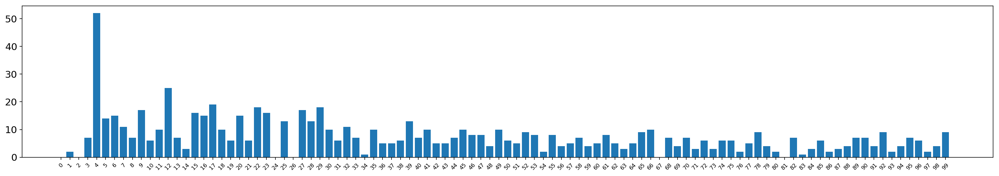

In [23]:
vals, counts = np.unique(np.concatenate(contam_pcs).flatten(),return_counts=True)

plt.figure(figsize=(25,4))
plt.bar(vals, counts);
plt.xticks(ticks=range(100),labels=range(100),rotation=45, size=8)
plt.grid()

print(sorted(list(zip(vals,counts)),key= lambda x: x[1], reverse=True)[:10])

In [24]:
LowQ_cells = adata.obs_names[adata.obs['celltype'] == 'LowQ'].values

In [25]:
keep_cells = np.setdiff1d(adata.obs_names.values, LowQ_cells)

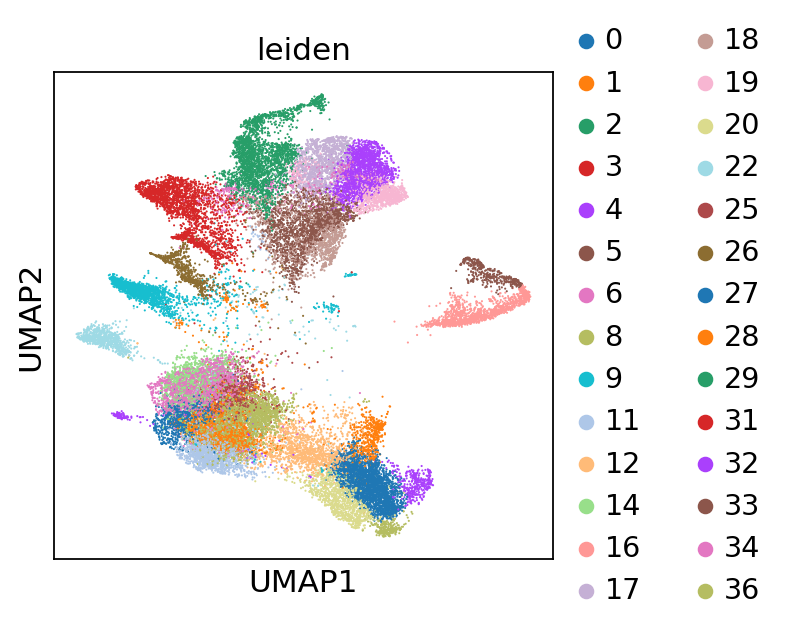

In [26]:
sc.pl.umap(adata[adata.obs['celltype'] != 'LowQ'],color='leiden',palette=sc.pl.palettes.vega_20_scanpy)

In [27]:
keep_genes = [i for i in adata.var_names if i not in contam_genes[:50]]

In [28]:
adata = adata[keep_cells].copy()

In [29]:
adata = adata[:,keep_genes].copy()

In [30]:
for i, j in zip([4,12], range(1,3)): # originally I recorded PC at index 5, but that's wrong: my histogram already reports zero-indexed PC location
    adata.obs['contam_pc_%s' % str(j)] = adata.obsm['X_pca'][:,i]

In [31]:
adata.obs.columns

Index(['batch', 'percent_mito_mouse', 'percent_mito_human', 'n_counts',
       'leiden', 'batch_0', 'batch_1', 'batch_2', 'batch_3', 'batch_4',
       'celltype', 'contam_pc_1', 'contam_pc_2'],
      dtype='object')

In [3]:
# adata.write_h5ad('/myvol/data2/deep/concat.deep.adata.m.and.h.combatted.dimred.h5ad')
adata = sc.read_h5ad('/myvol/data2/deep/concat.deep.adata.m.and.h.combatted.dimred.h5ad')

In [4]:
sc.pp.regress_out(adata,keys=['contam_pc_1', 'contam_pc_2'])

regressing out ['contam_pc_1', 'contam_pc_2']
    finished (0:06:26)


In [3]:
# adata.write_h5ad('/myvol/data2/deep/concat.deep.adata.m.and.h.combatted.dimred.regressed.h5ad')
adata = sc.read_h5ad('/myvol/data2/deep/concat.deep.adata.m.and.h.combatted.dimred.regressed.h5ad')

Regressing out recovers a lot of the batch effects, so I re-ran combat.

In [4]:
warnings.filterwarnings('ignore')
sc.pp.combat(adata)
warnings.filterwarnings('default')

Standardizing Data across genes.

Found 5 batches

Found 0 numerical variables:
	

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting data



In [3]:
# adata.write_h5ad('/myvol/data2/deep/concat.deep.adata.m.and.h.combatted.dimred.regressed.combatted.h5ad')
adata = sc.read_h5ad('/myvol/data2/deep/concat.deep.adata.m.and.h.combatted.dimred.regressed.combatted.h5ad')

#### Dimensionality Reduction and Visualization II

In [4]:
sc.pp.scale(adata, max_value=10)

In [5]:
sc.pp.pca(adata, n_comps=100)

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 100
    finished (0:00:26)


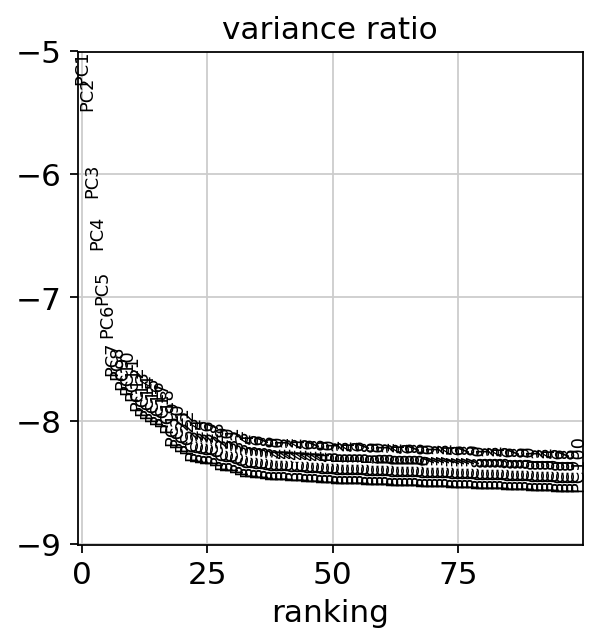

In [6]:
sc.pl.pca_variance_ratio(adata,log=True, n_pcs=100)

In [7]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(adata,n_neighbors=15,n_pcs=35) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')

computing neighbors
    using 'X_pca' with n_pcs = 35
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:14)


In [20]:
sc.tl.umap(adata)

In [21]:
sc.tl.leiden(adata,resolution=1)

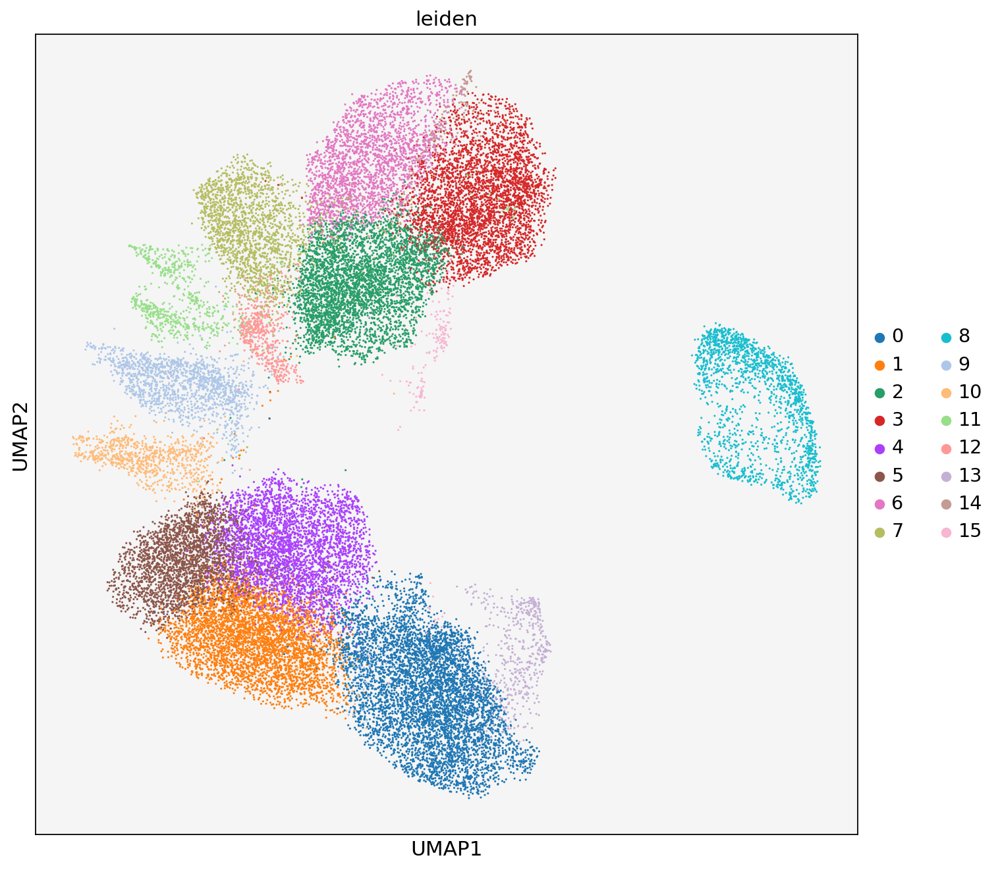

In [21]:
fig, ax = plt.subplots(1,1,figsize=(10,10))
ax.set_facecolor('whitesmoke')
sc.pl.umap(adata,color=['leiden'], ax=ax, size=8, palette=sc.pl.palettes.vega_20_scanpy)

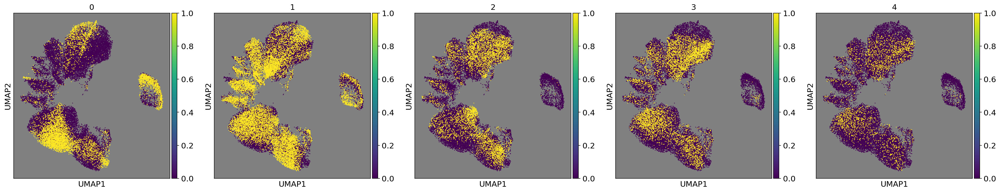

In [219]:
colorby = adata.obs['batch'].unique()
numplots = len(colorby)
fig, axes = plt.subplots(1,numplots,figsize=(25,25/numplots))
for group, ax in zip(colorby,np.ravel(axes)):
    ax.set_facecolor('gray')
    sc.pl.umap(adata,color='batch_%s' % str(group), sort_order=True, title=str(group), 
               ax=ax, return_fig=False, show=False, legend_loc=None, size=8, palette=['red'])
plt.tight_layout()

In [232]:
a, b = np.unique(adata.obs['batch'].values,return_counts=True)
for c, d in zip(a,b):
    print(str(d))

6669
13390
5376
5606
2495


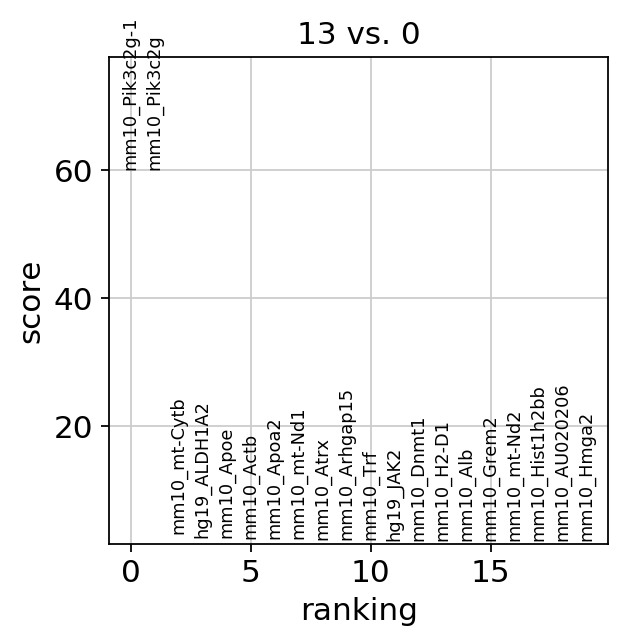

In [24]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata,groupby='leiden', groups=['13'], reference='0')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata)
sc.settings.verbosity = 3

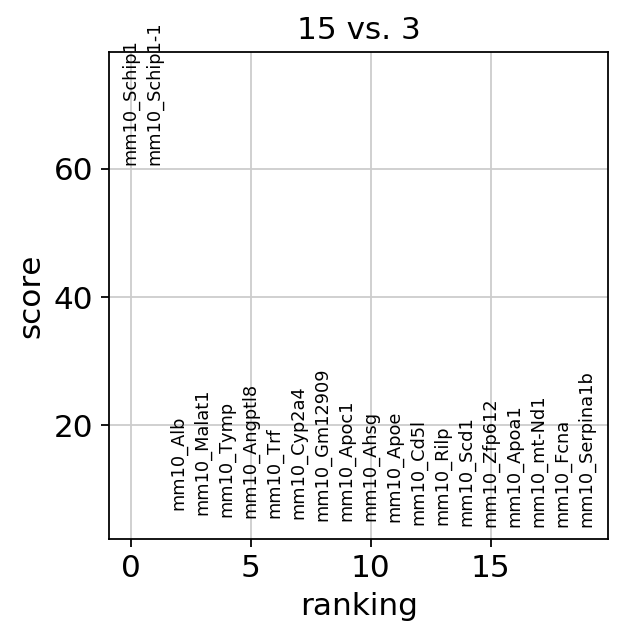

In [25]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata,groupby='leiden', groups=['15'], reference='3')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata)
sc.settings.verbosity = 3

Pretty sure those are low quality cells as well.

In [233]:
ctdict = dict()
ctdict['Immune and LSEC'] = [7, 9, 10, 11, 12]
ctdict['MC38'] = [2, 3, 6, 14]
ctdict['Liver'] = [0, 1, 4, 5]
ctdict['Human'] = [8]
ctdict['Pik3c2g'] = [13]
ctdict['Schip1'] = [15]
adata.obs['celltype'] = adata.obs['leiden']
for ct in ctdict:
    for clust in ctdict[ct]:
        adata.obs['celltype'].replace(r'^%s$' % str(clust),ct,regex=True, inplace=True)
adata.obs['celltype'] = adata.obs['celltype'].astype('category')

In [32]:
[i for i in adata.var_names if 'Neat' in i]

['mm10_Neat1']

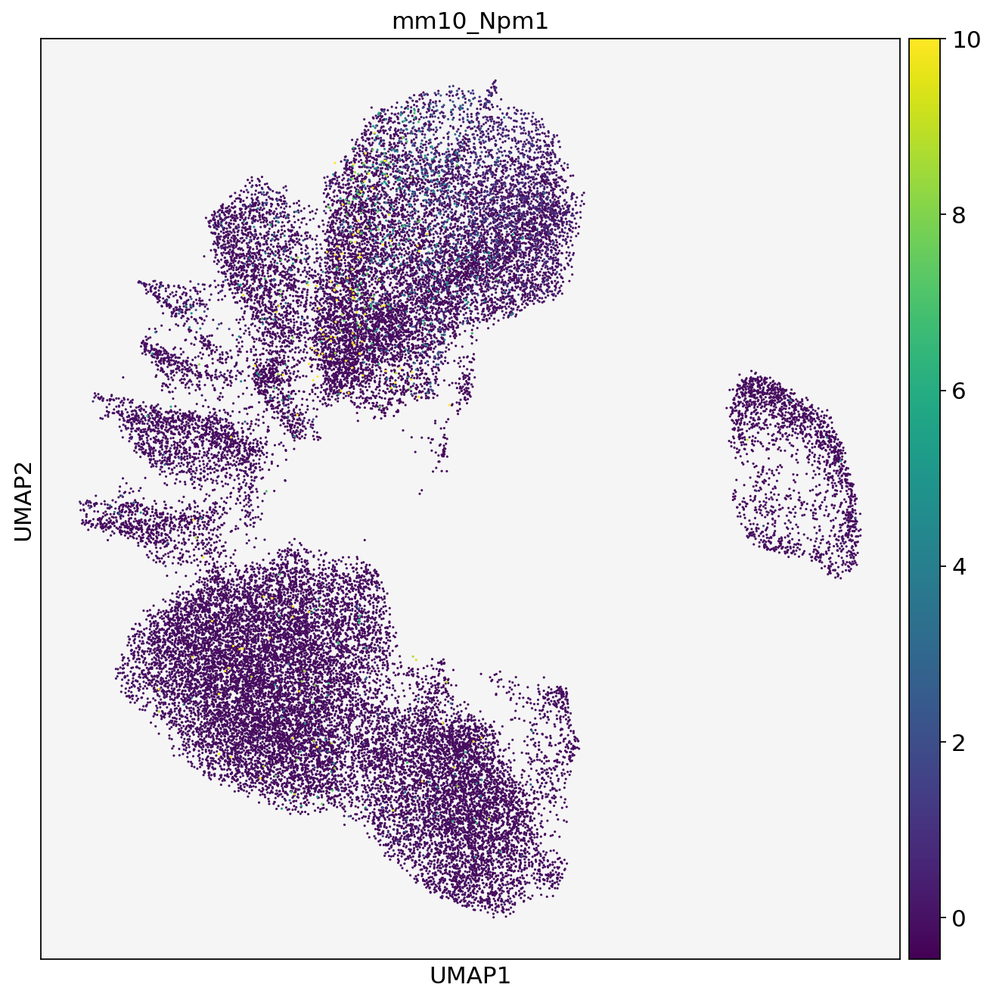

In [39]:
fig, ax = plt.subplots(1,1,figsize=(10,10))
ax.set_facecolor('whitesmoke')
sc.pl.umap(adata,color='mm10_Npm1', ax=ax, size=8, palette=sc.pl.palettes.vega_20_scanpy)

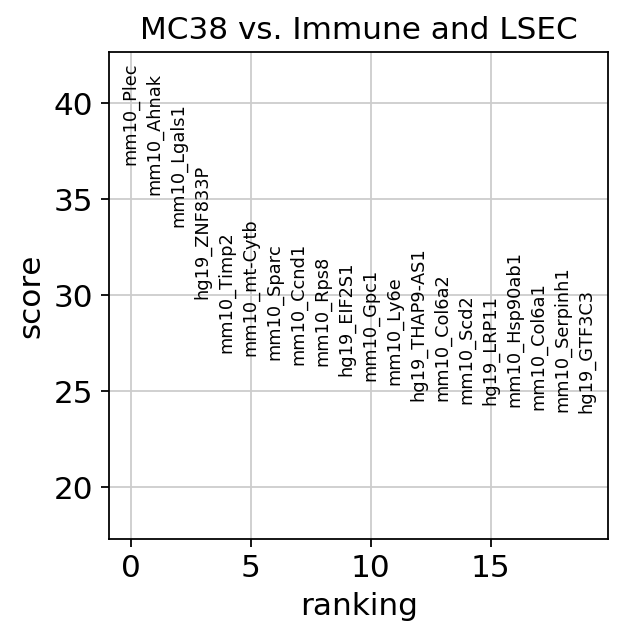

In [11]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata,groupby='celltype', groups=['MC38'], reference='Immune and LSEC')
cancer_genes = adata.uns['rank_genes_groups']['names']['MC38'][:100]
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata)
sc.settings.verbosity = 3

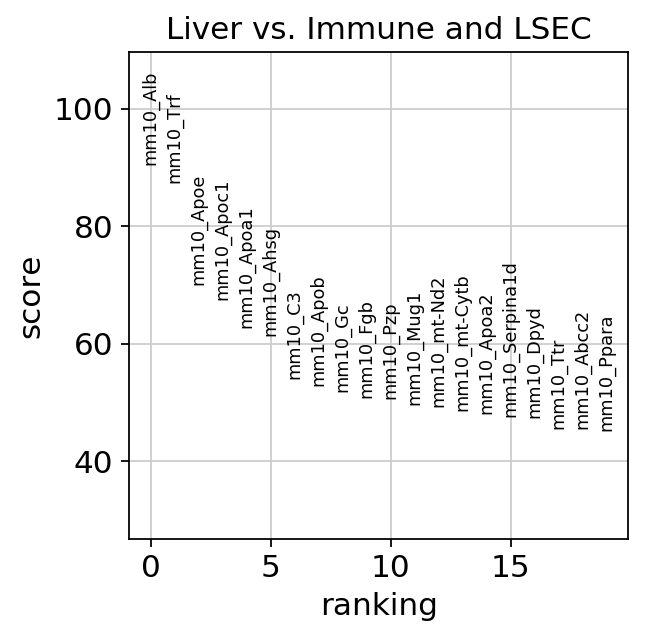

In [12]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata,groupby='celltype', groups=['Liver'], reference='Immune and LSEC')
liver_genes = adata.uns['rank_genes_groups']['names']['Liver'][:100]
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata)
sc.settings.verbosity = 3

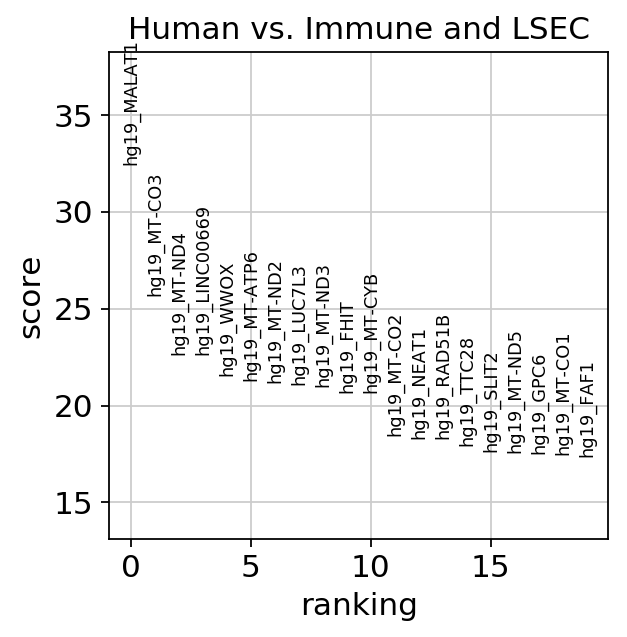

In [13]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata,groupby='celltype', groups=['Human'], reference='Immune and LSEC')
human_genes = adata.uns['rank_genes_groups']['names']['Human'][:100]
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata)
sc.settings.verbosity = 3